<a href="https://colab.research.google.com/github/ruiguo-bio/CADL/blob/master/tension_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Music generation with controlled tension

## install packages

In [1]:
!apt install musescore fluidsynth
!pip install music21 pyFluidSynth
!pip install pretty_midi

!git clone https://github.com/ruiguo-bio/colab_tension_vae.git

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  avahi-daemon bind9-host desktop-file-utils fluid-soundfont-gm
  fluidr3mono-gm-soundfont geoclue-2.0 geoip-database
  gstreamer1.0-plugins-base iio-sensor-proxy libavahi-core7 libavahi-glib1
  libbind9-160 libbrotli1 libcap2-bin libcdparanoia0 libdaemon0 libdns1100
  libfluidsynth1 libgeoclue-2-0 libgeoip1 libgl1-mesa-glx
  libgstreamer-plugins-base1.0-0 libgstreamer1.0-0 libhyphen0 libisc169
  libisccc160 libisccfg160 liblwres160 libmbim-glib4 libmbim-proxy libmm-glib0
  libnl-genl-3-200 libnss-mdns liborc-0.4-0 libpam-cap libportaudio2
  libpulsedsp libqmi-glib5 libqmi-proxy libqt5help5 libqt5positioning5
  libqt5qml5 libqt5quick5 libqt5sensors5 libqt5sql5-sqlite libqt5svg5
  libqt5webchannel5 libqt5webkit5 libqt5x11extras5 libqt5xmlpatterns5
  libvisual-0.4-0 libwoff1 modemmanager musescore-common pulseaudio-utils
  qml-module-qtgraph

In [2]:
cd colab_tension_vae/

/content/colab_tension_vae


In [3]:
import build_model
import util
import preprocess_midi

import pickle
import IPython.display as ipd
import os
import pretty_midi
import numpy as np
from google.colab import files

In [4]:
util.setup_musescore()

## Load model and tension feature vectors

In [5]:
model = build_model.build_model()

In [6]:
model.load_weights('model/vae.h5')

In [7]:
tensile_up_feature_vector = pickle.load(open('model/tensile_up_feature_vector','rb'))
diameter_up_feature_vector = pickle.load(open('model/diameter_up_feature_vector','rb'))

tensile_high_feature_vector = pickle.load(open('model/tensile_high_feature_vector','rb'))
diameter_high_feature_vector = pickle.load(open('model/diameter_high_feature_vector','rb'))

tensile_up_down_feature_vector = pickle.load(open('model/tensile_up_down_feature_vector','rb'))


def four_bar_iterate(pianoroll, model, feature_vectors,
                      factor_t,
                      factor_d,
                     first_up=True):

    number_of_iteration = pianoroll.shape[0] // 128
    result_roll = None
    tensile_strain = None
    diameter = None
    
    for i in range(number_of_iteration):
        
        random_selection = np.random.randint(0,len(feature_vectors))
        feature_vector = feature_vectors[random_selection]
        # print(f'feature vector number is {random_selection}')
        if np.array_equal(feature_vector,tensile_up_feature_vector) or np.array_equal(feature_vector,tensile_up_down_feature_vector):
            factor = factor_t
            print('tensile change')
        else:
            factor = factor_d
            print('diameter')

        for j in range(2):
            
            first_4_bar = 0 if j == 0 else 1 
            direction = 1 if j == 0 else -1
            direction = -1*direction if first_up is False else direction
            start_time_step = 128*i+64*first_4_bar
            print(f'number_of_iteration is {i}')
            # print(f'start_time_step is {start_time_step}')
            # print(f'j is {j}')
            input_roll = np.expand_dims(pianoroll[start_time_step:start_time_step+64,:],0)
            # print(f'input shape is {input_roll.shape}')
            z = model.layers[1].predict(input_roll)
            curr_factor = direction * (np.random.uniform(-1,1) + factor)
            print(f'factor is {curr_factor}')
            z_new = z + curr_factor * feature_vector
            reconstruction_new = model.layers[2].predict(z_new)
            result_new = util.result_sampling(np.concatenate(list(reconstruction_new), axis=-1))[0]
            tensile_new = np.squeeze(reconstruction_new[-2])
            diameter_new = np.squeeze(reconstruction_new[-1])

            if result_roll is None:
                result_roll = result_new
                tensile_strain = tensile_new
                diameter = diameter_new
            else:
                result_roll = np.vstack([result_roll,result_new])
                tensile_strain = np.concatenate([tensile_strain,tensile_new])
                diameter = np.concatenate([diameter,diameter_new])

            # print(f'result roll shape is {result_roll.shape}')
            # print(f'tensile_strain shape is {tensile_strain.shape}')
            # print(f'diameter shape is {diameter.shape}')
            # print('\n')
    
  
    start_time_step = 128*(i+1)
    result_roll = np.vstack([result_roll,pianoroll[start_time_step:,:]])


    return result_roll, tensile_strain, diameter

    


## select midi file

In [8]:

#@title # choose a midi file
#@markdown You can choose one of the examples provided here or upload your own midi file. If you upload your own file please make sure that the first track is melody and second track is bass, and the midi should be in C major or A minor.


def upload_midi():
    data = files.upload()
    if len(list(data.keys())) > 1:
        print('Multiple files uploaded; using only one.')
      
    return list(data.keys())[0]


melody = 'example4'  #@param ['example1','example2', 'example3','example4','Upload your midi']

if melody == 'Upload your midi':
    melody_file = upload_midi()
elif melody == 'example1':
    melody_file = 'data/041ea9c1df8b4163256c8a8a3ffb04dd'
elif melody == 'example2':
    melody_file = 'data/631133fa2ae7095bb9113087af86744e.mid'
elif melody == 'example3':
    melody_file = 'data/d0264d60827aa635c5bdf44627f4577a.mid'
else:
    melody_file = 'data/e6a4afe05f022c891bfe081d4be261db.mid'







  


## show the score and play 

In [9]:
piano_roll, bar_indices,pm_old = preprocess_midi.preprocess_midi(melody_file)
piano_roll_new = np.reshape(piano_roll,(-1,piano_roll.shape[-1]))
pm_new = util.roll_to_pretty_midi(piano_roll_new,pm_old)

In [10]:
# the original file music
ipd.Audio(pm_old.fluidsynth(fs=16000), rate=16000)

In [13]:
# the filtered new file music
# it concatenates 4 bar sections with both melody and bass tracks
ipd.Audio(pm_new.fluidsynth(fs=16000), rate=16000)

The new file score has only the first a few bars are showed here.
For full score please download midi files and use other program to view

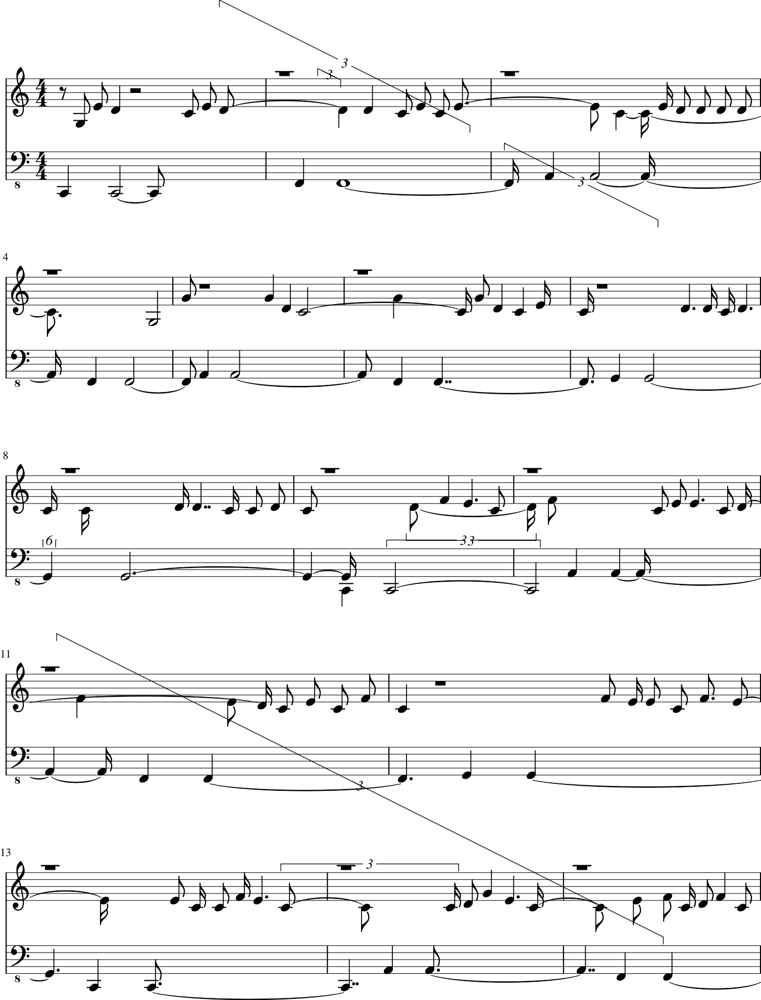

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [14]:
# the new file score
# only the first a few bars are showed here
# for full score please download midi files and use other program to view
util.show_score(pm_new)
pm_new.write('./filtered_4bar_concat.mid')
files.download('./filtered_4bar_concat.mid')

# tension manipulation

## apply tension change iteratively to all the song

In [15]:
#@title select the tension manipulations included

#@markdown the manipulations selected will be randomly applied to every 8 bars
#@markdown 



tensile_strain_direction = "yes" #@param ["yes", "no"]
diameter_direction = "no" #@param ["yes", "no"] {type:"string"}

tensile_strain_level = "no" #@param ["yes", "no"]
diameter_level = "yes" #@param ["yes", "no"]

tensile_strain_up_down = "no" #@param ["yes", "no"]

#@markdown select first 4 bar tension change factor sign for every 8 bar

first_change = "positive" #@param ["positive", "negative"]

#@markdown select the tension strain change factor
tensile_strain_factor = 6.5 #@param {type:"slider", min:1, max:7, step:0.5}

#@markdown select the diameter change factor
diameter_factor = 4 #@param {type:"slider", min:0.5, max:4, step:0.5}


feature_vectors = []


if tensile_strain_direction == 'yes':
    feature_vectors.append(tensile_up_feature_vector)

if diameter_direction == 'yes':
    feature_vectors.append(diameter_up_feature_vector)

if tensile_strain_level == 'yes':
    feature_vectors.append(tensile_high_feature_vector)

if diameter_level == 'yes':
    feature_vectors.append(diameter_high_feature_vector)

if tensile_strain_up_down == 'yes':
    feature_vectors.append(tensile_up_down_feature_vector)







Run this to apply tension change to the seleted bars

In [16]:
result_roll, tensile_strain, diameter = four_bar_iterate(piano_roll_new,model,
                                                          feature_vectors,
                                                         tensile_strain_factor,
                                                         diameter_factor,
                                                         first_change)

tensile change
number_of_iteration is 0
factor is 6.333768732694519
number_of_iteration is 0
factor is -6.050407294039787
tensile change
number_of_iteration is 1
factor is 5.633702738392654
number_of_iteration is 1
factor is -6.118442596897658
diameter
number_of_iteration is 2
factor is 4.727361778824861
number_of_iteration is 2
factor is -4.717931726174932
tensile change
number_of_iteration is 3
factor is 6.968499509399985
number_of_iteration is 3
factor is -7.391258666815733


new score


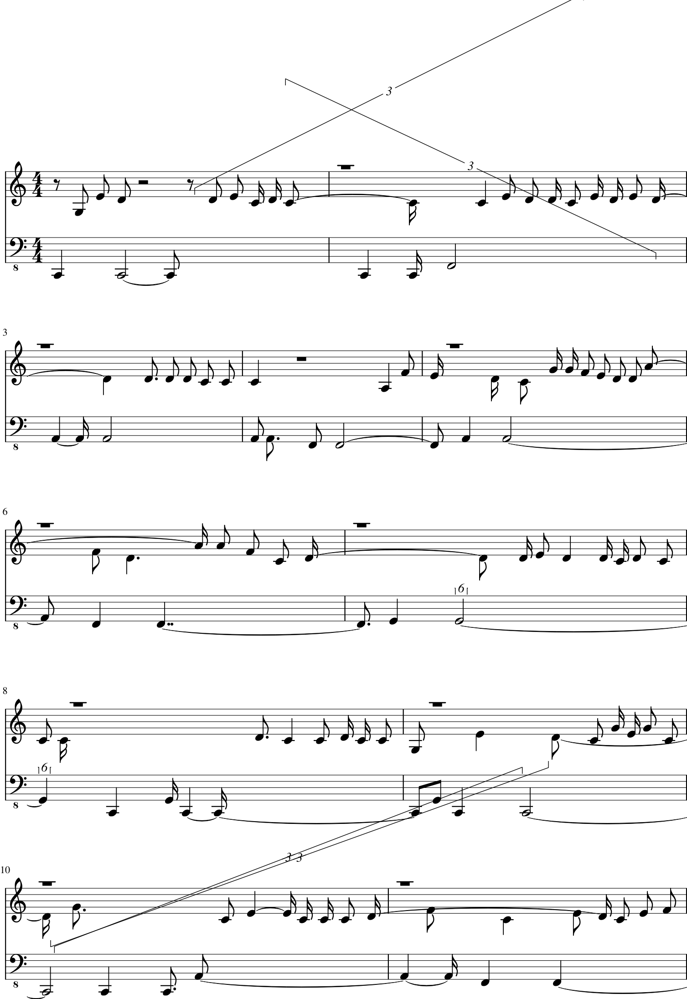

In [17]:

# pm_new = util.roll_to_pretty_midi(piano_roll_new,pm_old)
# print('original score')
# util.show_score(pm_new)
pm_result = util.roll_to_pretty_midi(result_roll,pm_old)
print('new score')
util.show_score(pm_result)


In [20]:
# the changed music
pm_result.write('./all_changed.mid')
files.download('./all_changed.mid')
ipd.Audio(pm_result.fluidsynth(fs=16000), rate=16000)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## change the tension to selected bars(4 or 8 bar)

In [21]:
#@title Please select start and end bar
#@markdown the selected bar length should be 4 bar or 8 bar

start_section = 1 #@param {type:"integer"}
end_section = 9 #@param {type:"integer"}



In [22]:
#@title select the tension manipulation
#@markdown first 4 bar


tensile_strain_direction1 = False #@param ["False", "True"] {type:"raw"}
tensile_strain_factor1 = 7.5 #@param {type:"slider", min:-8, max:8, step:0.5}

diameter_level1 = True #@param ["False", "True"] {type:"raw"}
diameter_factor1 = 4 #@param {type:"slider", min:-4, max:4, step:0.5}

#@markdown second 4 bar (optional)

tensile_strain_direction2 = True #@param ["False", "True"] {type:"raw"}
tensile_strain_factor2 = 8 #@param {type:"slider", min:-8, max:8, step:0.5}

diameter_level2 = False #@param ["False", "True"] {type:"raw"}
diameter_factor2 = -4 #@param {type:"slider", min:-4, max:4, step:0.5}



run this to apply tension change

first four bar tension


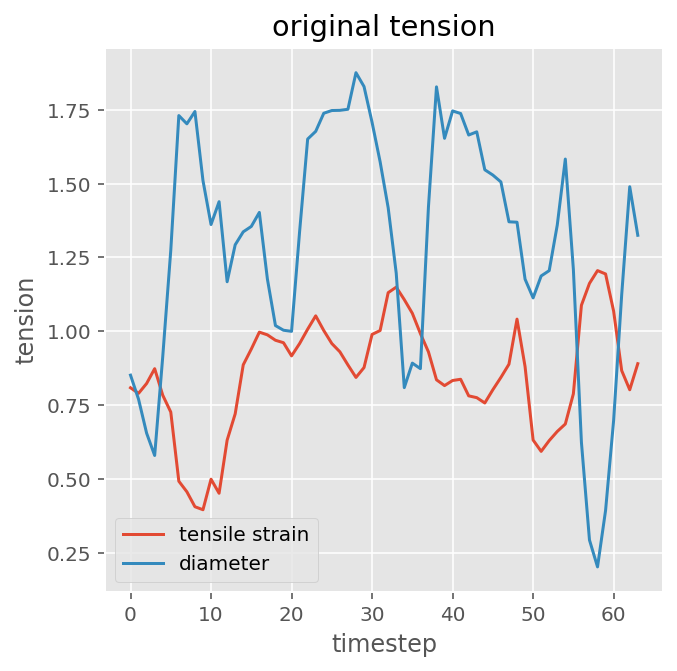

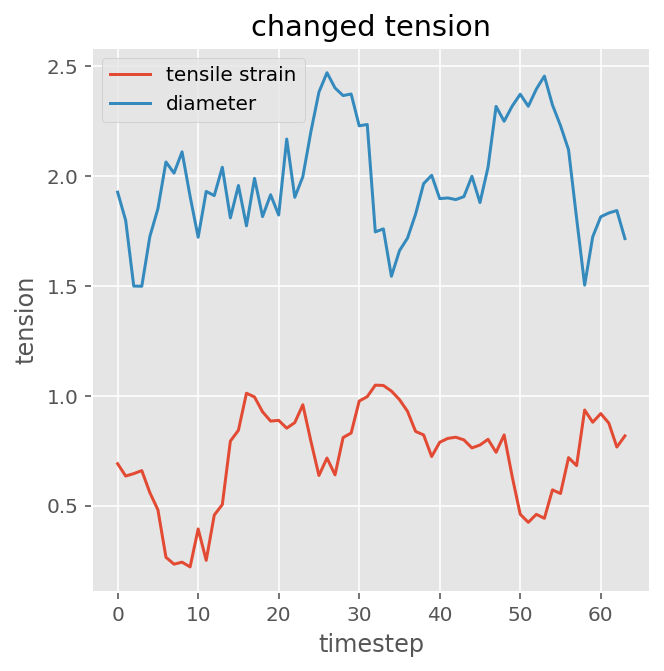

second four bar tension


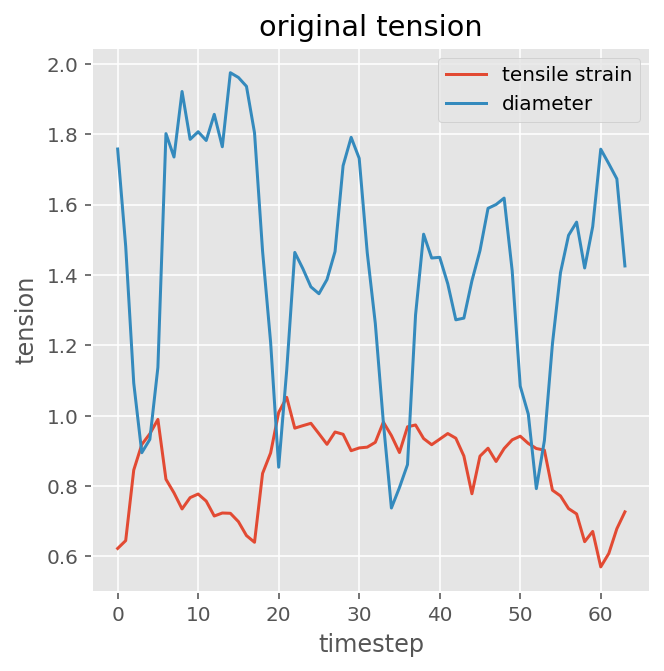

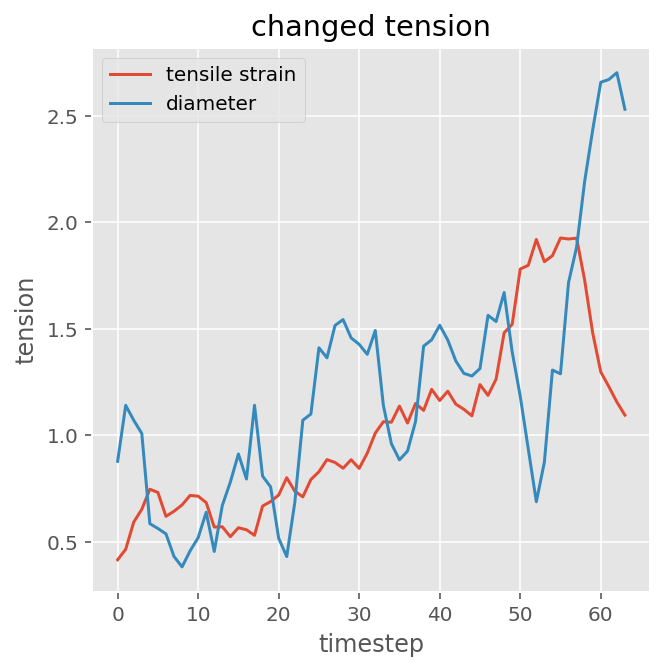

original score


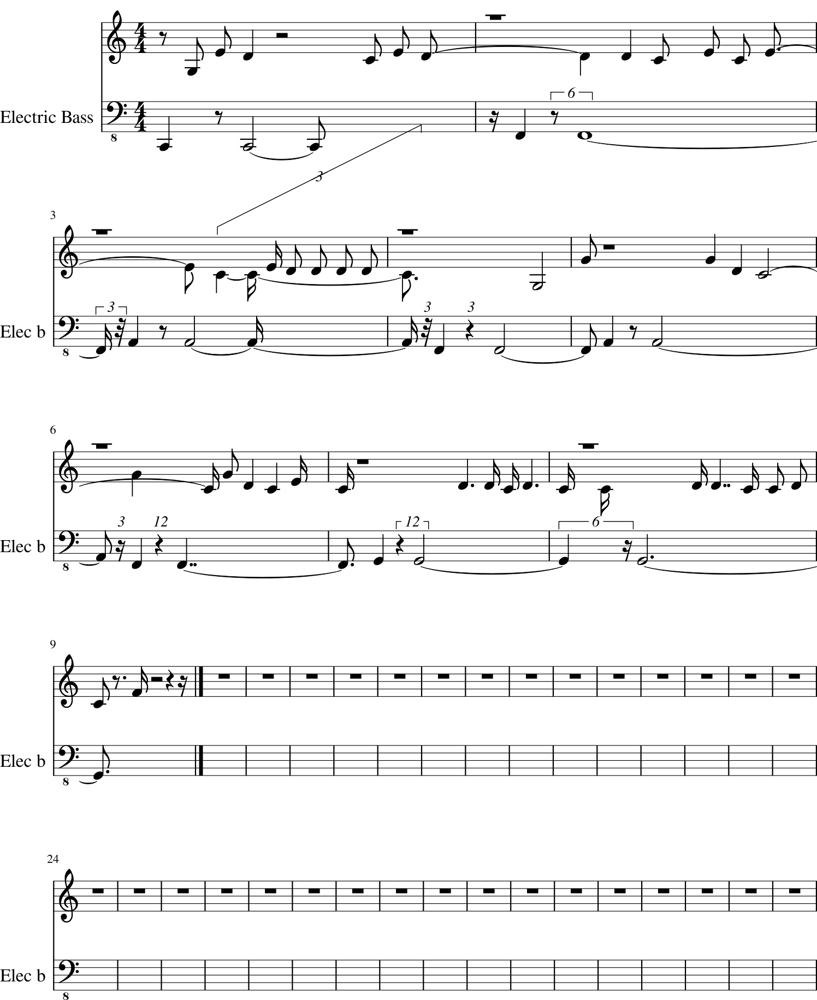

new score


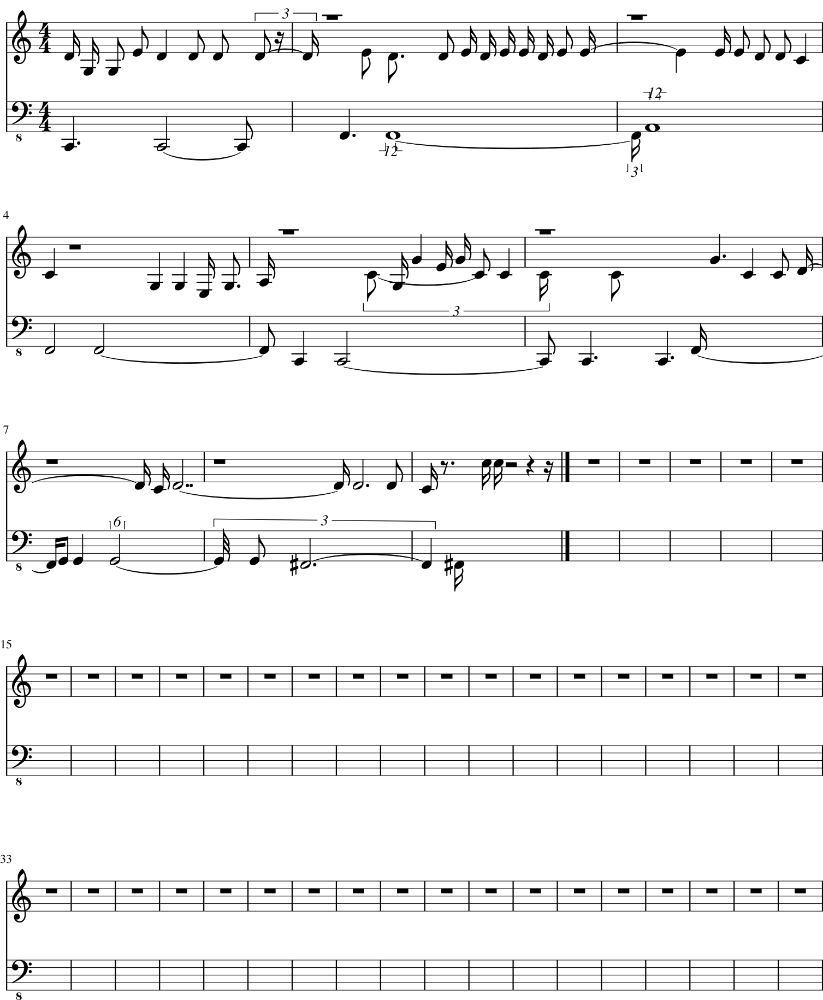

In [25]:

selected_roll1 = piano_roll_new[16*(start_section-1):16*(start_section + 4-1)]
print('first four bar tension')
_,result_roll1 = build_model.manipuate_latent_space(selected_roll1,tensile_up_feature_vector,
                                    diameter_high_feature_vector,
                                    tensile_up_down_feature_vector,
                                    model,tensile_strain_factor1,
                                    diameter_factor1,0,
                                    tensile_strain_direction1,diameter_level1,False,
                                    True,True)



if end_section-start_section>4:
    selected_roll2 = piano_roll_new[16*(start_section + 3):16*(end_section-1)]
    print('second four bar tension')
    _,result_roll2 = build_model.manipuate_latent_space(selected_roll2,tensile_up_feature_vector,
                                    diameter_high_feature_vector,
                                    tensile_up_down_feature_vector,
                                    model,tensile_strain_factor2,
                                    diameter_factor2,0,
                                    tensile_strain_direction2,diameter_level2,False,
                                    True,True)


    result_roll = np.vstack([result_roll1,result_roll2])
    original_roll = piano_roll_new[16*(start_section-1):16*(end_section-1)]
else:
    result_roll = result_roll1
    original_roll = selected_roll1



pm_original = util.roll_to_pretty_midi(original_roll,pm_old)
pm_new = util.roll_to_pretty_midi(result_roll,pm_old)
print('original score')
util.show_score(pm_original)
print('new score')
util.show_score(pm_new)

        



original music

In [26]:
ipd.Audio(pm_original.fluidsynth(fs=16000), rate=16000)



changed music

In [27]:
ipd.Audio(pm_new.fluidsynth(fs=16000), rate=16000)